### As the way to kick off the project and be able to handle data manipulation and analysis, the first thing it is import the libraries. For (McKinney, 2017) Numpy provides structures of data, algorithms and libraries that support scientific applications as numerical data, otherwise Pandas library provides functions and data structures supporting tabular data fast and with expressive way. The Matplotlib for the same authors offers plots and two-dimensional data visualizations. To finish the highlight of libraries the Sklearn is used to Machine Learning including CLassifications, Regressions, Clusterings, Model, Preprocessing, etc. And the warnings is used here to avoid warning over the project and not pollute visually the flow on it.

In [1]:
import pandas as pd
import statistics as stats
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set()

import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

### I have called the function pd.read_csv to read the file uploaded for the project, and I named as student_data, which will be used  over the project to represent the dataset uploaded.

In [2]:
student_data=pd.read_csv('student_data.csv')

### The below  was called the function .head to start the visualization and the structure of the dataset, specially the Rows and Columns as described it; and the headers of the dataset, it is the first step to getting perceptions about the data. About the Rows they will be mentioned and represented by observations; and the Columns by features or variables over the next functions and comments.

In [3]:
student_data.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171.0,1,1,122.0,1,19,12.0,...,0,0.0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254.0,1,1,160.0,1,1,3.0,...,0,6.0,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070.0,1,1,122.0,1,37,37.0,...,0,6.0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773.0,1,1,122.0,1,38,37.0,...,0,6.0,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014.0,0,1,100.0,1,37,38.0,...,0,6.0,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


### Then just for a double checking over the end of the variables to see if there is anomalies or not with the function .tail. It seems good to go!

In [4]:
student_data.tail()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
4419,1,1,6,9773.0,1,1,125.0,1,1,1.0,...,0,6.0,8,5,12.666667,0,15.5,2.8,-4.06,Graduate
4420,1,1,2,9773.0,1,1,120.0,105,1,1.0,...,0,6.0,6,2,11.000000,0,11.1,0.6,2.02,Dropout
4421,1,1,1,9500.0,1,1,154.0,1,37,37.0,...,0,8.0,9,1,13.500000,0,13.9,-0.3,0.79,Dropout
4422,1,1,1,9147.0,1,1,180.0,1,37,37.0,...,0,5.0,6,5,12.000000,0,9.4,-0.8,-3.12,Graduate
4423,1,10,1,9773.0,1,1,152.0,22,38,37.0,...,0,6.0,6,6,13.000000,0,12.7,3.7,-1.70,Graduate


### Still in early stages it was called the function .shape to return how many observations and features the data has. On this project the are 4424 observations and 37 features.

In [5]:
student_data.shape

(4424, 37)

### It was called the function .describe to visualize the data and itself format as min, max, 50% standard deviation and count.

In [6]:
student_data.describe()

,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,4424.000000,4424.000000,4423.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4423.000000,4424.000000,...,4424.000000,4424.000000,4423.000000,4424.000000,4424.000000,4423.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,18.669078,1.727848,8856.458738,0.890823,4.577758,132.613314,1.873192,19.561935,22.271987,10.960895,...,0.137658,0.541817,6.231743,8.063291,4.435805,10.229941,0.150316,11.566139,1.228029,0.001969
std,17.484682,1.313793,2063.763479,0.311897,10.216592,13.188332,6.914514,15.603186,15.343244,26.418253,...,0.690880,1.918546,2.196038,3.947951,3.014764,5.211367,0.753774,2.663850,1.382711,2.269935
min,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,4.000000,...,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,5.000000,...,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,9.000000,...,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,57.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,194.000000,...,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


### The function called here through the Pandas library .set_option it is meaning to show up all the features with no abreviations or omissions.

In [7]:
pd.set_option('display.max_columns', None)
student_data.describe()

,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Educational special needs,Debtor,Gender,Scholarship holder,International,Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,4424.000000,4424.000000,4423.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4423.000000,4424.000000,4424.000000,4423.000000,4424.000000,4423.000000,4424.000000,4424.000000,4423.000000,4424.000000,4424.000000,4424.000000,4423.000000,4424.000000,4424.000000,4423.000000,4424.000000,4424.000000,4423.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,18.669078,1.727848,8856.458738,0.890823,4.577758,132.613314,1.873192,19.561935,22.271987,10.960895,11.032324,126.984219,0.011528,0.113724,0.351718,0.248418,0.024870,6.270570,8.299051,4.706600,10.640100,0.137658,0.541817,6.231743,8.063291,4.435805,10.229941,0.150316,11.566139,1.228029,0.001969
std,17.484682,1.313793,2063.763479,0.311897,10.216592,13.188332,6.914514,15.603186,15.343244,26.418253,25.263040,14.477954,0.106760,0.317511,0.477560,0.432144,0.155746,2.480178,4.179106,3.094238,4.843973,0.690880,1.918546,2.196038,3.947951,3.014764,5.211367,0.753774,2.663850,1.382711,2.269935
min,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,0.000000,0.000000,95.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,4.000000,4.000000,117.900000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,6.000000,3.000000,11.000000,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,5.000000,7.000000,126.100000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,8.000000,5.000000,12.285714,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,9.000000,9.000000,134.800000,0.000000,0.000000,1.000000,0.000000,0.000000,7.000000,10.000000,6.000000,13.399000,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,57.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,194.000000,195.000000,190.000000,1.000000,1.000000,1.000000,1.000000,1.000000,26.000000,45.000000,26.000000,18.875000,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


### Now it is time to call the function .info. This function returns the different info as numer of features and observations; the name of each features and the Dtype itself, for example object, int64 or float, etc

In [8]:
student_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital status                                  4424 non-null   object 
 1   Application mode                                4424 non-null   int64  
 2   Application order                               4424 non-null   int64  
 3   Course                                          4423 non-null   float64
 4   Daytime/evening attendance                      4424 non-null   int64  
 5   Previous qualification                          4424 non-null   int64  
 6   Previous qualification (grade)                  4424 non-null   float64
 7   Nacionality                                     4424 non-null   int64  
 8   Mother's qualification                          4424 non-null   int64  
 9   Father's qualification                   

### After having seen all the functions above, it is time to identify if the dataset contains missing values or not. This function .isnull().values.any() will be running through all the observations and returns all the headers that have missing values. As the return below is True, we know that we have to check one by one and kick off the process to clean up the data.

In [9]:
student_data.isnull().values.any()

True

### This function .isnull().values.any() will be running through all the observations and returns all the headers that have missing values. As the return below returned True - we know that we have to check one of each and kick off the process to clean up the data. At this example is showing up that the features Course, Father's qualification, Admission grade and another have missing values.

In [10]:
student_data.isnull().sum()

Marital status                                    0
Application mode                                  0
Application order                                 0
Course                                            1
Daytime/evening attendance                        0
Previous qualification                            0
Previous qualification (grade)                    0
Nacionality                                       0
Mother's qualification                            0
Father's qualification                            1
Mother's occupation                               0
Father's occupation                               0
Admission grade                                   1
Displaced                                         0
Educational special needs                         0
Debtor                                            1
Tuition fees up to date                           1
Gender                                            0
Scholarship holder                                0
Age at enrol

### As a better way to return clarified the features that have missing values was called the function isna().any()].tolist(). As mentioned by (McKinney, 2017) this function returns boolean array indicating each value is Not a Number; and the tolist() return as a list.

In [11]:
columns_with_nan = student_data.columns[student_data.isna().any()].tolist()
print(columns_with_nan)

['Course', "Father's qualification", 'Admission grade', 'Debtor', 'Tuition fees up to date', 'International', 'Curricular units 1st sem (grade)', 'Curricular units 2nd sem (enrolled)', 'Curricular units 2nd sem (grade)']


### Then for better clarification and avoid futures issues it was decided to be adjusted and tranformed the header's name as some of them have a special characters like '()' and ''' like  Curricular units 1st sem (credited), Previous qualification (grade) and anothers. Those can return some errors on future functions to be called.

In [12]:
student_data.rename(columns={"Marital status": "Marital_status"}, inplace=True)
student_data.rename(columns={"Application mode": "Application_mode"}, inplace=True)
student_data.rename(columns={"Application order": "Application_order"}, inplace=True)
student_data.rename(columns={"Daytime/evening attendance": "Daytime/evening_attendance"}, inplace=True)
student_data.rename(columns={"Previous qualification": "Previous_qualification"}, inplace=True)
student_data.rename(columns={"Previous qualification (grade)": "Previous_qualification_grade"}, inplace=True)
student_data.rename(columns={"Mother's qualification": "Mother_qualification"}, inplace=True)
student_data.rename(columns={"Father's qualification": "Father_qualification"}, inplace=True)
student_data.rename(columns={"Mother's occupation": "Mother_occupation"}, inplace=True)
student_data.rename(columns={"Father's occupation": "Father_occupation"}, inplace=True)
student_data.rename(columns={"Admission grade": "Admission_grade"}, inplace=True)
student_data.rename(columns={"Educational special needs": "Educational_special_needs"}, inplace=True)
student_data.rename(columns={"Tuition fees up to date": "Tuition_fees_up_to_date"}, inplace=True)
student_data.rename(columns={"Scholarship holder": "Scholarship_holder"}, inplace=True)
student_data.rename(columns={"Age at enrollment": "Age_at_enrollment"}, inplace=True)
student_data.rename(columns={"Curricular units 1st sem (credited)": "Curricular_units_1st_sem_credited"}, inplace=True)
student_data.rename(columns={"Curricular units 1st sem (enrolled)": "Curricular_units_1st_sem_enrolled"}, inplace=True)
student_data.rename(columns={"Curricular units 1st sem (evaluations)": "Curricular_units_1st_sem_evaluations"}, inplace=True)
student_data.rename(columns={"Curricular units 1st sem (approved)": "Curricular_units_1st_sem_approved"}, inplace=True)
student_data.rename(columns={"Curricular units 1st sem (grade)": "Curricular_units_1st_sem_grade"}, inplace=True)
student_data.rename(columns={"Curricular units 1st sem (without evaluations)": "Curricular_units_1st_sem_without_evaluations"}, inplace=True)
student_data.rename(columns={"Curricular units 2nd sem (credited)": "Curricular_units_2nd_sem_credited"}, inplace=True)
student_data.rename(columns={"Curricular units 2nd sem (enrolled)": "Curricular_units_2nd_sem_enrolled"}, inplace=True)
student_data.rename(columns={"Curricular units 2nd sem (evaluations)": "Curricular_units_2nd_sem_evaluations"}, inplace=True)
student_data.rename(columns={"Curricular units 2nd sem (approved) ": "Curricular_units_2nd_sem_approved"}, inplace=True)
student_data.rename(columns={"Curricular units 2nd sem (grade)": "Curricular_units_2nd_sem_grade"}, inplace=True)
student_data.rename(columns={"Curricular units 2nd sem (without evaluations)": "Curricular_units_2nd_sem_without_evaluations"}, inplace=True)
student_data.rename(columns={"Unemployment rate": "Unemployment_rate"}, inplace=True)
student_data.rename(columns={"Inflation rate ": "Inflation_rate"}, inplace=True)

### After the adjusts, we can see better visualisation on the features and itself.

In [13]:
student_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Marital_status                                4424 non-null   object 
 1   Application_mode                              4424 non-null   int64  
 2   Application_order                             4424 non-null   int64  
 3   Course                                        4423 non-null   float64
 4   Daytime/evening_attendance                    4424 non-null   int64  
 5   Previous_qualification                        4424 non-null   int64  
 6   Previous_qualification_grade                  4424 non-null   float64
 7   Nacionality                                   4424 non-null   int64  
 8   Mother_qualification                          4424 non-null   int64  
 9   Father_qualification                          4423 non-null   f

### Now as a part of the process of the cleaning data, it was called the function .unique which returned which type of data are contains on each feature highlighted like  Marital_status, Course, Father_qualification, etc. If we take a look at onto the array the first example has '?' which represent a object type even that the rest of the feature contain numerical data. Each observation can belong to only one category, and a variable for example can be categorical or numerical, not both at the same time technically. This will have more sense on the future of this project when should be created the PCA and other functions. Se will see examples as ?, NaN, Na, and unknown on these variables.

In [14]:
student_data['Marital_status'].unique()

array(['1', '2', '4', '?', '3', '5', '6'], dtype=object)

### On this example the function returned for a 'nan' value. It means that could be missing the data or it was not filled by some agent for example. For (McKinney, 2017) this function returns the sorted unique values in an array. These other examples below are bringing similar cases:

In [15]:
student_data['Course'].unique()

array([ 171., 9254., 9070., 9773., 8014., 9991., 9500., 9238., 9670.,
       9853., 9085., 9130., 9556., 9147., 9003.,   33., 9119.,   nan])

In [16]:
student_data['Father_qualification'].unique()

array([12.,  3., 37., 38.,  1., 19.,  5.,  4., 34.,  2., 39., 11.,  9.,
       nan, 36., 26., 40., 14., 20., 35., 41., 22., 13., 29., 43., 18.,
       42., 10.,  6., 30., 25., 44., 33., 27., 31.])

In [17]:
student_data['Admission_grade'].unique()

array([127.3, 142.5, 124.8, 119.6, 141.5, 114.8, 128.4, 113.1, 129.3,
       123. , 130.6, 119.3, 130.2, 111.8, 137.1, 120.7, 137.4, 136.3,
       124.6, 120.3, 121.8, 125.5, 114.9, 123.9, 157. , 116.4, 131. ,
       122.1, 118.8, 150. , 130. , 138.8, 134.5, 131.4, 102.5, 128.8,
       122.9, 113.9, 120. , 121.1, 120.4, 100.6, 121.4, 109.7, 134.1,
       127.6, 132.4, 133.4, 126.1, 113.5, 121.3, 159.3, 129.1, 155.3,
       139.8, 115.2, 131.9, 126. , 120.9, 128.2, 120.1, 100. , 134. ,
       130.8, 135.8, 111.7, 132.9, 115.5, 106. , 117. , 110.2, 155.7,
       180.4, 110. , 161. , 117.6, 128.7, 112.2, 100.8, 105. , 114. ,
       137. , 124.9, 134.3, 111.5, 160. , 117.4, 122.2, 118.2, 106.7,
       108.2, 107. , 136.1, 115.3, 140.4, 113.4, 118.6, 122.3, 127.9,
       117.1, 145.3, 122.6, 128. , 123.7, 131.7, 133.2, 109.3, 113. ,
       157.9, 112.1, 174.7, 110.1,  99.7, 121. , 119.1, 124.7, 117.2,
       131.5, 121.7, 123.4, 132.8, 108.7, 138.1, 126.5, 127.4, 123.6,
       122. , 125.8,

In [18]:
student_data['Displaced'].unique()

array(['1', '0', '?'], dtype=object)

In [19]:
student_data['Debtor'].unique()

array([ 0.,  1., nan])

In [20]:
student_data['Tuition_fees_up_to_date'].unique()

array(['1', '0', nan, '?'], dtype=object)

In [21]:
student_data['International'].unique()

array([ 0.,  1., nan])

In [22]:
student_data['Curricular_units_1st_sem_grade'].unique()

array([ 0.        , 14.        , 13.42857143, 12.33333333, 11.85714286,
       13.3       , 13.875     , 11.4       , 13.21428571, 10.57142857,
       13.25      , 13.2       , 12.        , 13.30625   , 12.5       ,
       11.66666667, 11.4375    , 12.85714286, 13.375     , 13.29666667,
       11.6       , 11.375     , 12.66666667, 12.93333333, 12.83333333,
       11.33333333, 12.4       , 10.        , 11.        , 12.75      ,
       14.8       , 13.928     , 13.        , 11.5       , 13.51666667,
       13.66666667, 11.83333333, 14.71428571, 10.6       , 13.04444444,
       14.935     , 13.13333333, 11.9       , 12.57142857, 11.2       ,
       11.975     , 10.33333333, 10.5       , 14.84285714, 12.2       ,
       12.16666667, 13.08      , 10.66666667, 11.875     , 13.75      ,
       14.2       , 11.96      , 12.875     , 14.63157895, 13.26666667,
       13.85714286, 13.4       , 12.51666667, 11.61666667, 13.14285714,
       12.6       , 10.8       , 12.8       , 14.16666667, 12.1 

In [23]:
student_data['Curricular_units_2nd_sem_enrolled'].unique()

array([ 0.,  6.,  5.,  8.,  7., 11., 12.,  9., 13., 19.,  3., 10.,  4.,
       nan, 17.,  2.,  1., 14., 15., 16., 23., 18., 21.])

In [24]:
student_data['Curricular_units_2nd_sem_grade'].unique()

array([ 0.        , 13.66666667, 12.4       , 13.        , 11.5       ,
       14.345     , 14.14285714, 13.5       , 14.2       , 13.21428571,
       11.        , 12.        , 14.545     , 12.25      , 11.425     ,
       12.85714286, 12.28571429, 14.11428571, 13.28571429, 12.33333333,
       13.71666667, 10.57142857, 13.4       , 14.375     , 13.42857143,
       10.        , 11.6       , 15.8       , 14.34285714, 13.8       ,
       14.33333333, 13.2       , 13.77142857, 12.83333333, 14.16666667,
       11.83333333, 13.595     , 12.9       , 14.935     , 12.22142857,
       12.42857143, 10.75      , 10.8       , 13.75      , 10.85714286,
       13.33333333, 15.05555556, 11.66666667, 12.2       , 13.3       ,
       11.33333333, 13.08      , 11.2       , 13.25      , 14.47777778,
       14.23076923, 12.27272727, 12.3       , 15.        , 12.8       ,
       12.57142857, 12.51666667, 10.66666667, 11.4       , 14.        ,
       11.25      , 13.77777778, 15.01111111, 13.74285714, 14.6 

In [25]:
student_data['Age_at_enrollment'].unique()

array(['20', '19', '45', '50', '18', '22', '21', '34', '37', '43', '55',
       '39', '29', '24', '27', '23', '26', '33', '35', '25', '44', '36',
       '47', '28', '38', 'UnKnown', '30', '31', '32', '40', '42', '48',
       '49', '46', '41', '70', '60', '53', '51', '52', '54', '61', '58',
       '59', '17', '57', '62'], dtype=object)

In [26]:
student_data['Curricular_units_1st_sem_credited'].unique()

array(['0', '2', '3', '6', '7', '13', '4', '1', '5', '19', '11', '8',
       '10', '9', '15', '12', '14', '18', '17', '16', '20', 'Na'],
      dtype=object)

### As we have seen before some data are objects, and as the Machine Learning algorithm only reads matematical values and its to be able to cross-reference the observations we must to transform into numerical. The function that can perfom this is the .to_numeric; and the errors='coerce' means that when the convertion fails this missing values that are different, then object  will be changed per NaN. If we have to transform some missing value in int, float64 or object this function will be perfoming to be changed the missing value to a NaN. 

In [27]:
student_data['Marital_status'] = pd.to_numeric(student_data['Marital_status'], errors='coerce')

In [28]:
student_data['Displaced'] = pd.to_numeric(student_data['Displaced'], errors='coerce')

In [29]:
student_data['Tuition_fees_up_to_date'] = pd.to_numeric(student_data['Tuition_fees_up_to_date'], errors='coerce')

In [30]:
student_data['Age_at_enrollment'] = pd.to_numeric(student_data['Age_at_enrollment'], errors='coerce')

In [31]:
student_data['Curricular_units_1st_sem_credited'] = pd.to_numeric(student_data['Curricular_units_1st_sem_credited'], errors='coerce')

### Below we can see that it were trnasformed into float64

In [32]:
student_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Marital_status                                4423 non-null   float64
 1   Application_mode                              4424 non-null   int64  
 2   Application_order                             4424 non-null   int64  
 3   Course                                        4423 non-null   float64
 4   Daytime/evening_attendance                    4424 non-null   int64  
 5   Previous_qualification                        4424 non-null   int64  
 6   Previous_qualification_grade                  4424 non-null   float64
 7   Nacionality                                   4424 non-null   int64  
 8   Mother_qualification                          4424 non-null   int64  
 9   Father_qualification                          4423 non-null   f

### Then after transformed the object into a floating point number (float 64) as mentioned by (McKinney, 2017), was called again the function .isna().any()].tolist() to identify which columns now have missing values as NaN.

In [33]:
columns_with_nan = student_data.columns[student_data.isna().any()].tolist()
print(columns_with_nan)

['Marital_status', 'Course', 'Father_qualification', 'Admission_grade', 'Displaced', 'Debtor', 'Tuition_fees_up_to_date', 'Age_at_enrollment', 'International', 'Curricular_units_1st_sem_credited', 'Curricular_units_1st_sem_grade', 'Curricular_units_2nd_sem_enrolled', 'Curricular_units_2nd_sem_grade']


### Now we are able to define the min and then after replace the NaN per the value that will be better fitted. On this case the value chosen here was the min value. Why not zero, for example? because as some features are represeting some qualitative data that were transformed in encoding for facility the conversion of the data, as better way to calculate and be converted by the algorithm of Machine Learning. 

### Then if the zero be the value chosen, then it won't be the best representation of the characteristics that are answering questions about the features. Also it was not chosen the 50% even that some of then has mean and 50% close of, because some of the features are just binary variable like 1 and 0, and anothers features like Marital_Status has some numbers that not zero (1 – single 2 – married 3 – widower 4 – divorced 5 – facto union 6 – legally separated), then could be happen a new missing value or error. Therefore the min value chosen it seems representing a low impact into the cout of the variable and observations, also because most of the variable has only 1 or 2 observations each are repsenting a low number if comparated with the count, less than 1% of the sample.

In [34]:
student_data_min_Marital_status = student_data['Marital_status'].min()
student_data_min_Marital_status

1.0

In [35]:
student_data_min_course = student_data['Course'].min()
student_data_min_course

33.0

In [36]:
student_data_min_Father_qualification = student_data['Father_qualification'].min()
student_data_min_Father_qualification

1.0

In [37]:
student_data_min_Admission_grade = student_data['Admission_grade'].min()
student_data_min_Admission_grade

95.0

In [38]:
student_data_min_Displaced = student_data['Displaced'].min()
student_data_min_Displaced

0.0

In [39]:
student_data_min_Debtor = student_data['Debtor'].min()
student_data_min_Debtor

0.0

In [40]:
student_data_min_Tuition_fees_up_to_date = student_data['Tuition_fees_up_to_date'].min()
student_data_min_Tuition_fees_up_to_date

0.0

In [41]:
student_data_min_International = student_data['International'].min()
student_data_min_International

0.0

In [42]:
student_data_min_Curricular_units_1st_sem_grade = student_data['Curricular_units_1st_sem_grade'].min()
student_data_min_Curricular_units_1st_sem_grade

0.0

In [43]:
student_data_min_Curricular_units_2nd_sem_enrolled= student_data['Curricular_units_2nd_sem_enrolled'].min()
student_data_min_Curricular_units_2nd_sem_enrolled

0.0

In [44]:
student_data_min_Curricular_units_2nd_sem_grade = student_data['Curricular_units_2nd_sem_grade'].min()
student_data_min_Curricular_units_2nd_sem_grade

0.0

In [45]:
student_data_min_Age_at_enrollment = student_data['Age_at_enrollment'].min()
student_data_min_Age_at_enrollment

17.0

In [46]:
student_data_min_Curricular_units_1st_sem_credited = student_data['Curricular_units_1st_sem_credited'].min()
student_data_min_Curricular_units_1st_sem_credited

0.0

### After definied the min as a function, now it is time to replace the NaN for the min mentioning the function crated with the min above:

In [47]:
columns_with_nan = student_data.columns[student_data.isna().any()].tolist()
print(columns_with_nan)

['Marital_status', 'Course', 'Father_qualification', 'Admission_grade', 'Displaced', 'Debtor', 'Tuition_fees_up_to_date', 'Age_at_enrollment', 'International', 'Curricular_units_1st_sem_credited', 'Curricular_units_1st_sem_grade', 'Curricular_units_2nd_sem_enrolled', 'Curricular_units_2nd_sem_grade']


In [48]:
student_data['Marital_status'] = student_data['Marital_status'].fillna(student_data['Marital_status'].min())

In [49]:
student_data['Marital_status'] = student_data['Marital_status'].fillna(student_data_min_Marital_status)
student_data['Marital_status']

0       1.0
1       1.0
2       1.0
3       1.0
4       2.0
       ... 
4419    1.0
4420    1.0
4421    1.0
4422    1.0
4423    1.0
Name: Marital_status, Length: 4424, dtype: float64

In [50]:
student_data['Course'] = student_data['Course'].fillna(student_data_min_course)
student_data['Course']

0        171.0
1       9254.0
2       9070.0
3       9773.0
4       8014.0
         ...  
4419    9773.0
4420    9773.0
4421    9500.0
4422    9147.0
4423    9773.0
Name: Course, Length: 4424, dtype: float64

In [51]:
student_data['Father_qualification'] = student_data['Father_qualification'].fillna(student_data_min_Father_qualification)
student_data['Father_qualification']

0       12.0
1        3.0
2       37.0
3       37.0
4       38.0
        ... 
4419     1.0
4420     1.0
4421    37.0
4422    37.0
4423    37.0
Name: Father_qualification, Length: 4424, dtype: float64

In [52]:
student_data['Admission_grade'] = student_data['Admission_grade'].fillna(student_data_min_Admission_grade)
student_data['Admission_grade']

0       127.3
1       142.5
2       124.8
3       119.6
4       141.5
        ...  
4419    122.2
4420    119.0
4421    149.5
4422    153.8
4423    152.0
Name: Admission_grade, Length: 4424, dtype: float64

In [53]:
student_data['Displaced'] = student_data['Displaced'].fillna(student_data_min_Displaced)
student_data['Displaced']

0       1.0
1       1.0
2       1.0
3       1.0
4       0.0
       ... 
4419    0.0
4420    1.0
4421    1.0
4422    1.0
4423    1.0
Name: Displaced, Length: 4424, dtype: float64

In [54]:
student_data['Debtor'] = student_data['Debtor'].fillna(student_data_min_Debtor)
student_data['Debtor']

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
4419    0.0
4420    1.0
4421    0.0
4422    0.0
4423    0.0
Name: Debtor, Length: 4424, dtype: float64

In [55]:
student_data['Tuition_fees_up_to_date'] = student_data['Tuition_fees_up_to_date'].fillna(student_data_min_Tuition_fees_up_to_date)
student_data['Tuition_fees_up_to_date']

0       1.0
1       0.0
2       0.0
3       1.0
4       1.0
       ... 
4419    1.0
4420    0.0
4421    1.0
4422    1.0
4423    1.0
Name: Tuition_fees_up_to_date, Length: 4424, dtype: float64

In [56]:
student_data['International'] = student_data['International'].fillna(student_data_min_International)
student_data['International']

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
4419    0.0
4420    1.0
4421    0.0
4422    0.0
4423    1.0
Name: International, Length: 4424, dtype: float64

In [57]:
student_data['Curricular_units_1st_sem_grade'] = student_data['Curricular_units_1st_sem_grade'].fillna(student_data_min_Curricular_units_1st_sem_grade)
student_data['Curricular_units_1st_sem_grade']

0        0.000000
1       14.000000
2        0.000000
3       13.428571
4       12.333333
          ...    
4419    13.600000
4420    12.000000
4421    14.912500
4422    13.800000
4423    11.666667
Name: Curricular_units_1st_sem_grade, Length: 4424, dtype: float64

In [58]:
student_data['Curricular_units_2nd_sem_enrolled'] = student_data['Curricular_units_2nd_sem_enrolled'].fillna(student_data_min_Curricular_units_2nd_sem_enrolled)
student_data['Curricular_units_2nd_sem_enrolled']

0       0.0
1       6.0
2       6.0
3       6.0
4       6.0
       ... 
4419    6.0
4420    6.0
4421    8.0
4422    5.0
4423    6.0
Name: Curricular_units_2nd_sem_enrolled, Length: 4424, dtype: float64

In [59]:
student_data['Curricular_units_2nd_sem_grade'] = student_data['Curricular_units_2nd_sem_grade'].fillna(student_data_min_Curricular_units_2nd_sem_grade)
student_data['Curricular_units_2nd_sem_grade']

0        0.000000
1       13.666667
2        0.000000
3       12.400000
4       13.000000
          ...    
4419    12.666667
4420    11.000000
4421    13.500000
4422    12.000000
4423    13.000000
Name: Curricular_units_2nd_sem_grade, Length: 4424, dtype: float64

In [60]:
student_data['Age_at_enrollment'] = student_data['Age_at_enrollment'].fillna(student_data_min_Age_at_enrollment)
student_data['Age_at_enrollment']

0       20.0
1       19.0
2       19.0
3       20.0
4       45.0
        ... 
4419    19.0
4420    18.0
4421    30.0
4422    20.0
4423    22.0
Name: Age_at_enrollment, Length: 4424, dtype: float64

In [61]:
student_data['Curricular_units_1st_sem_credited'] = student_data['Curricular_units_1st_sem_credited'].fillna(student_data_min_Curricular_units_1st_sem_credited)
student_data['Curricular_units_1st_sem_credited']

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
4419    0.0
4420    0.0
4421    0.0
4422    0.0
4423    0.0
Name: Curricular_units_1st_sem_credited, Length: 4424, dtype: float64

### After transformed the missing value into min, it was called the function .isnull and .values.any() to doble check if still has a missing values. It seems good to go!

In [62]:
student_data.isnull().sum()

Marital_status                                  0
Application_mode                                0
Application_order                               0
Course                                          0
Daytime/evening_attendance                      0
Previous_qualification                          0
Previous_qualification_grade                    0
Nacionality                                     0
Mother_qualification                            0
Father_qualification                            0
Mother_occupation                               0
Father_occupation                               0
Admission_grade                                 0
Displaced                                       0
Educational_special_needs                       0
Debtor                                          0
Tuition_fees_up_to_date                         0
Gender                                          0
Scholarship_holder                              0
Age_at_enrollment                               0


In [63]:
student_data.isnull().values.any()

False

### Now it is time to edit the dependent variable, in this case the Target one. The reason is that after adjusted all the objects and missing values can be handle the dtype and Enconding Categorical in the future that will be need to convert categorical to numerical:

In [64]:
col_object = student_data.select_dtypes(include=['object'])
names_col_object = col_object.columns.tolist()
names_col_object

['Target']

### Then after returned the data into the feature Target, we are able to see that there are 7 different type of data as Dropout', 'Graduate', 'Enrolled', 'Grad', 'graduate', 'Drop', 'dropout'. It seems like Grad, graduate, Drop, Dropout belongs to Graduate and Dropout because some of letters are uppercase or undercase; and some of them are abbreviation of words. Then to reduce and replace them for the same representation was used the function .replace.

In [65]:
student_data['Target'].unique()

array(['Dropout', 'Graduate', 'Enrolled', 'Grad', 'graduate', 'Drop',
       'dropout'], dtype=object)

In [66]:
student_data['Target'].replace('Grad', 'Graduate', inplace = True)
student_data['Target'].replace('graduate', 'Graduate', inplace = True)
student_data['Target'].replace('Drop', 'Dropout', inplace = True)
student_data['Target'].replace('dropout', 'Dropout', inplace = True)

In [67]:
student_data['Target'].unique()

array(['Dropout', 'Graduate', 'Enrolled'], dtype=object)

## Finally arrived at PCA part! 
### Must of the most dataset will be necessary PCA then first thing is split the data, as does not perform PCA on the dependent variable, it should be removed of the rest. Then after that have to do the dimension, because we wanna 99.5% on the signal of the data.

In [68]:
student_data_no_label=student_data.drop(columns=['Target'])

In [69]:
student_data_no_label.head()

,Marital_status,Application_mode,Application_order,Course,Daytime/evening_attendance,Previous_qualification,Previous_qualification_grade,Nacionality,Mother_qualification,Father_qualification,Mother_occupation,Father_occupation,Admission_grade,Displaced,Educational_special_needs,Debtor,Tuition_fees_up_to_date,Gender,Scholarship_holder,Age_at_enrollment,International,Curricular_units_1st_sem_credited,Curricular_units_1st_sem_enrolled,Curricular_units_1st_sem_evaluations,Curricular_units_1st_sem_approved,Curricular_units_1st_sem_grade,Curricular_units_1st_sem_without_evaluations,Curricular_units_2nd_sem_credited,Curricular_units_2nd_sem_enrolled,Curricular_units_2nd_sem_evaluations,Curricular units 2nd sem (approved),Curricular_units_2nd_sem_grade,Curricular_units_2nd_sem_without_evaluations,Unemployment_rate,Inflation rate,GDP
0,1.0,17,5,171.0,1,1,122.0,1,19,12.0,5,9,127.3,1.0,0,0.0,1.0,1,0,20.0,0.0,0.0,0,0,0,0.000000,0,0,0.0,0,0,0.000000,0,10.8,1.4,1.74
1,1.0,15,1,9254.0,1,1,160.0,1,1,3.0,3,3,142.5,1.0,0,0.0,0.0,1,0,19.0,0.0,0.0,6,6,6,14.000000,0,0,6.0,6,6,13.666667,0,13.9,-0.3,0.79
2,1.0,1,5,9070.0,1,1,122.0,1,37,37.0,9,9,124.8,1.0,0,0.0,0.0,1,0,19.0,0.0,0.0,6,0,0,0.000000,0,0,6.0,0,0,0.000000,0,10.8,1.4,1.74
3,1.0,17,2,9773.0,1,1,122.0,1,38,37.0,5,3,119.6,1.0,0,0.0,1.0,0,0,20.0,0.0,0.0,6,8,6,13.428571,0,0,6.0,10,5,12.400000,0,9.4,-0.8,-3.12
4,2.0,39,1,8014.0,0,1,100.0,1,37,38.0,9,9,141.5,0.0,0,0.0,1.0,0,0,45.0,0.0,0.0,6,9,5,12.333333,0,0,6.0,6,6,13.000000,0,13.9,-0.3,0.79


In [70]:
pca = PCA().fit(student_data_no_label)

Text(0, 0.5, 'cumulative explained variance')

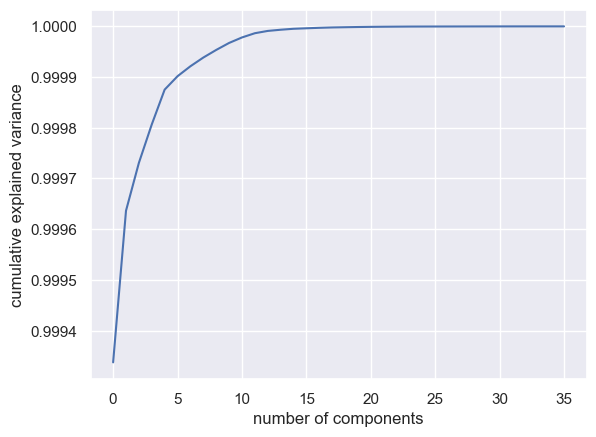

In [71]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

### Then the pca has returned that around 15 is the number of components necessary to be explained the variance. What is telling us is that to representing the data set in a short dimensional space keeping the 99.5% of the original variance we need at least 15 features.

In [72]:
pca = PCA(15)

### Important note: It was tried with 5 e 10 as number of components, but the Accuracy returned bad if comparated with 15 numbers of components:

#### 15 Accuracy 71,48%
#### 10 Accuracy 66,48%
#### 5 Accuracy 54,81%


In [73]:
projected = pca.fit_transform(student_data_no_label)

### From now on we are not droping features from my original dataset, but from the PCA. Then the Projected now is keeping the 4424 observations but with 15 features. Take a look at into the Project function called, this is the result after tranformed the original data in a new dimensional space.

In [74]:
projected.shape

(4424, 15)

In [75]:
projected

array([[ 8.68348256e+03, -8.25464960e-01, -1.46437769e+00, ...,
        -2.23240737e+00,  5.73685685e-01, -9.32711818e-01],
       [-3.99488050e+02, -1.37726180e+01,  2.89955176e+01, ...,
        -3.62952572e+00,  1.36918877e+00,  1.33131483e+00],
       [-2.15513006e+02, -2.05638090e+00, -8.58103878e+00, ...,
         4.72967782e+00,  6.41207842e+00, -8.07670773e-01],
       ...,
       [-6.45514010e+02, -3.08261864e+00, -3.50096752e+00, ...,
        -1.91399041e+00, -2.40554712e+00,  1.19325514e+00],
       [-2.92486718e+02, -8.18966095e+00,  1.49235844e+00, ...,
        -1.96545760e+00, -1.92016965e-02, -3.87848961e-01],
       [-9.18507462e+02, -5.82192015e+00, -6.69135012e+00, ...,
         2.32891001e-02,  8.45684831e-01,  2.38961953e+00]])

### To edit and add new headers the function projected, columns are calling the names as C1, C2, C3.. until C15 to create them.

In [76]:
student_data_pca = pd.DataFrame(projected, columns=['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15'])

In [77]:
student_data_pca.head()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,C15
0,8683.482555,-0.825465,-1.464378,-6.040270,-15.096446,6.896181,3.380478,5.373646,-6.444183,-2.852723,-1.147293,-5.401609,-2.232407,0.573686,-0.932712
1,-399.488050,-13.772618,28.995518,22.696242,15.103408,1.444503,-12.088942,-1.407867,2.313308,-1.874947,-3.024269,-0.224369,-3.629526,1.369189,1.331315
2,-215.513006,-2.056381,-8.581039,-27.775613,8.529794,2.696188,4.308176,4.185896,-18.581392,2.651384,0.709876,-3.791680,4.729678,6.412078,-0.807671
3,-918.557531,-9.020168,-18.090815,-18.974206,1.551860,2.018240,3.232333,0.317039,2.749055,0.933216,-0.082347,-5.874469,-0.827678,-0.948204,0.050695
4,840.428241,-0.126917,-36.387477,-0.505675,-7.175183,3.608640,22.415125,27.889870,4.347563,2.027229,0.721378,7.207282,-7.783085,-0.597406,2.308375


### Now as an important step of the PCA we are adding again the Target variable, because it was created the new features and should be added the as itself is the target variable. We can double check in the end of .head the column was added in.

In [78]:
student_data_pca['Target']=student_data['Target']

In [79]:
student_data_pca.head()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,C15,Target
0,8683.482555,-0.825465,-1.464378,-6.040270,-15.096446,6.896181,3.380478,5.373646,-6.444183,-2.852723,-1.147293,-5.401609,-2.232407,0.573686,-0.932712,Dropout
1,-399.488050,-13.772618,28.995518,22.696242,15.103408,1.444503,-12.088942,-1.407867,2.313308,-1.874947,-3.024269,-0.224369,-3.629526,1.369189,1.331315,Graduate
2,-215.513006,-2.056381,-8.581039,-27.775613,8.529794,2.696188,4.308176,4.185896,-18.581392,2.651384,0.709876,-3.791680,4.729678,6.412078,-0.807671,Dropout
3,-918.557531,-9.020168,-18.090815,-18.974206,1.551860,2.018240,3.232333,0.317039,2.749055,0.933216,-0.082347,-5.874469,-0.827678,-0.948204,0.050695,Graduate
4,840.428241,-0.126917,-36.387477,-0.505675,-7.175183,3.608640,22.415125,27.889870,4.347563,2.027229,0.721378,7.207282,-7.783085,-0.597406,2.308375,Graduate


### Now its time to testing the algorithm extracting the values from the dataFrame and training for Machine Learning.

In [80]:
student_data_array = student_data_pca.values

In [81]:
student_data_array

array([[8683.482555057039, -0.8254649599755927, -1.4643776858492463, ...,
        0.5736856849069335, -0.9327118183307105, 'Dropout'],
       [-399.48805040333036, -13.772618001324886, 28.99551758080848, ...,
        1.3691887730523795, 1.331314834986551, 'Graduate'],
       [-215.51300573353686, -2.056380897387496, -8.581038784210012, ...,
        6.412078418018726, -0.8076707732706182, 'Dropout'],
       ...,
       [-645.5140102542068, -3.082618640088465, -3.5009675235446376, ...,
        -2.4055471153532046, 1.1932551440187993, 'Dropout'],
       [-292.48671759208725, -8.189660949768061, 1.4923584359213191, ...,
        -0.019201696541773613, -0.3878489611090405, 'Graduate'],
       [-918.507462364595, -5.821920147754833, -6.691350116348593, ...,
        0.8456848305763017, 2.3896195323443177, 'Graduate']], dtype=object)

### Then, to be able to tranining and testing it should be splitted into two parts. Extracting the independent and dependent variables. Here its being considered:

#### X = dependent variable =  C1, C2, C3, C4...
#### Y = independent variable = Target

In [82]:
from sklearn.model_selection import train_test_split
X = student_data_array[:,0:15]
y = student_data_array[:,15]

X_train, X_validation, Y_train, Y_validation = train_test_split(X, y, test_size=0.20, random_state=42)  ## 42, 1?

### Then after determined the X and Y to training and test the model, it were chosen 7 different model to see which one the model has more accuracy and quality to perform them.

In [83]:
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC

In [84]:
models = []
models.append(('LR', LogisticRegression(solver='liblinear', multi_class='ovr')))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(gamma='auto')))

### On the functions below n_split is representing the number of divisions or folds will be created on the dataframe as mentioned in Sklearn Documentation (2024) usually 10 is the default of re-shuffling.
### The random_state is representing to be able to reproduce results on the same way, the train-test splits are always deterministic, or if do not used it, it will be different each time as mentioned by Sklearn Documentation (2024);
### The function shuffle is representing that the data is shuffled randomly as mentioned by Sklearn Documentation (2024).

In [85]:
results = []
names = []
for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=1, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    print('%s: %f (%f)' % (name, cv_results.mean(), cv_results.std()))

LR: 0.714897 (0.026330)
LDA: 0.705007 (0.023809)
KNN: 0.594814 (0.029094)
CART: 0.621919 (0.038671)
NB: 0.647650 (0.024606)
SVM: 0.506640 (0.001793)


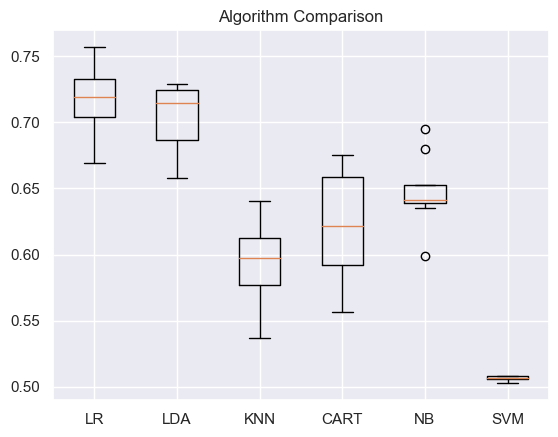

In [86]:
pyplot.boxplot(results, labels=names)
pyplot.title('Algorithm Comparison')
pyplot.show()

### What is it the best accuracy in this model then? It is the Logistic Regression (LR) the model that has high average precision, and the second one the Linear Discriminant Analysis (LDA).

### This Logistic Regression is a suitable model to deal with classifications problens with multiple classes  and itself could be used the (ovr) One-vs-Rest to deal with multiple classes. And the 'liblinear' is ifficient for short data or middle datasets and is suitable to resolve problems with binary classification or multiclass, Sklearn Documentation (2024).

In [87]:
model = LogisticRegression(solver='liblinear', multi_class='ovr')
model.fit(X_train, Y_train)
predictions = model.predict(X_validation)

In [88]:
print(accuracy_score(Y_validation, predictions))
print(confusion_matrix(Y_validation, predictions))

0.6870056497175141
[[200  25  91]
 [ 38  24  89]
 [ 25   9 384]]


### On the above it means the number (0) Dropout has 200 correct Score, incorrectly 1
### the second Graduate (1) has 384 correctly Score, 9 incorrectly, and 25 incorrectly.
### and the third Enrolled (2) has 8 correctly Score, and 1 incorrectly.

### What the data is proving us is we dont have a very good dataset but anyway is not bad accuracy as well, that is given us 71.48%.

### Just as model of visualisation after changed the random_state to 1, 42 and 80 to checking if could be better changing the number, the best accuracy found was through the 1.

### Also, its important mention that it were executed 3 different random_state 1, 42 and 80 as the below the best one was with 1:

### 1    >   accuracy  71.48% 
### 42   >   accuracy  71.12%
### 80   >   accuracy  71.34%

### random_state= 1
#### LR: 0.714897 (0.026330)
#### LDA: 0.705007 (0.023809)
#### KNN: 0.602442 (0.024285)
#### CART: 0.622484 (0.035171)
#### NB: 0.647650 (0.024606)
#### SVM: 0.506640 (0.001793)
    
### random_state = 42
#### LR: 0.712349 (0.011825)
#### LDA: 0.702740 (0.015630)
#### KNN: 0.600456 (0.022851)
#### CART: 0.611471 (0.021547)
#### NB: 0.645380 (0.016234)

### random_state = 80
#### LR: 0.713478 (0.018828)
#### LDA: 0.703869 (0.019055)
#### KNN: 0.591974 (0.021496)
#### CART: 0.621364 (0.018905)
#### NB: 0.643971 (0.017337)

In [89]:
from sklearn.preprocessing import LabelEncoder
from numpy import asarray
data = asarray([['Dropout'], ['Graduate'], ['Enrolled']])
data

array([['Dropout'],
       ['Graduate'],
       ['Enrolled']], dtype='<U8')

In [90]:
encoder = LabelEncoder()

### Time to transforming data into number, even that it was changed previously, the encoder.fit will be able to tranform in numerical and more than this adjusting for Machine Learning algorithm understand that we do not wanna sum the amount represented by the data into the Target variable (Dropout = 0, Graduate = 2, Unrolled = 1).

### what we wanna here is representing that between those data the system should be considering that contain or not contain the variable. 

In [91]:
result=encoder.fit_transform(data)
result

array([0, 2, 1], dtype=int64)

In [92]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)
result = encoder.fit_transform(data)
result

array([[1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.]])

## Visualisations:

### As mentioned by McKinney (2017) the visualizations is one of the most important step in data analysis. It may be a part of the exploratory process.

### We are looking for mean components that can help us to understand the structure of the data after reduce the dimensionality, this dimensionality will be explained better in the end of the project.
### This cross-references can reveal patterns or tendencies that can be not perceptive just with the original dataset, then can be returned insights and adding to quantiative results through the algorithms.

In [93]:
student_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Marital_status                                4424 non-null   float64
 1   Application_mode                              4424 non-null   int64  
 2   Application_order                             4424 non-null   int64  
 3   Course                                        4424 non-null   float64
 4   Daytime/evening_attendance                    4424 non-null   int64  
 5   Previous_qualification                        4424 non-null   int64  
 6   Previous_qualification_grade                  4424 non-null   float64
 7   Nacionality                                   4424 non-null   int64  
 8   Mother_qualification                          4424 non-null   int64  
 9   Father_qualification                          4424 non-null   f

## Visualisations choices:

### The Scatterplot is used when the independent variable has multiple values for your dependent variable and see is there is correlation or not, if it is positive or negative, for example. We gonna be used Scatterplots, boxplot, pie chart and displot.

### There are many different ways to draw a scatterplot. One of the most basic, which should be used when both variables are numeric, through the .scatterplot() function defining X and Y. Adding some attibutes the default kind in .relplot (it can also be forced by setting kind="scatter") by mentioned into the Seaborn Documentation (2024).

### The pie chart is used to display relative frequencies and no more than approximately 7 frequencies only as mentioned by David in the classes.

### The Boxplot as Seaborn Documentation (2024) shows the distribution of quantitative data in a way that is usefull to comparisons between variables or across levels of a categorical variable.

### Displot as Seaborn Documentation (2024) provides access to several approaches for visualizing the univariate or bivariate distribution of data as subsets of data defined by semantic mapping and faceting across multiple subplots. 

### On the following five graphs and on the Pairplot we can see that after realized the PCA the scatterplots returns significance clarity and good relation  between the variance of the variables:

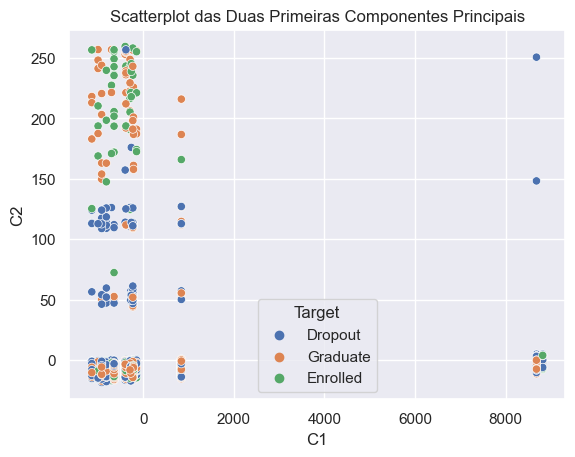

In [94]:
student_data_pca = student_data_pca[['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'Target']]

sns.scatterplot(data=student_data_pca, x='C1', y='C2', hue='Target')

plt.title('Scatterplot das Duas Primeiras Componentes Principais')
plt.show()

### The function hue delimits: this function delimits that it is calling to be used the feature 'Target' of the DataFrame with a categorical variable to determine the colors of the points into the paiplot.Can be either used for numerical.

### Also we can see a positive correlation as one variable increases so does the other variable as well.

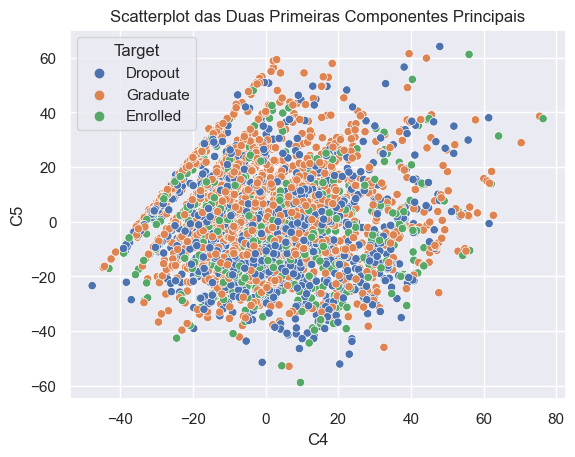

In [95]:
student_data_pca = student_data_pca[['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'Target']]

sns.scatterplot(data=student_data_pca, x='C4', y='C5', hue='Target')

plt.title('Scatterplot das Duas Primeiras Componentes Principais')
plt.show()

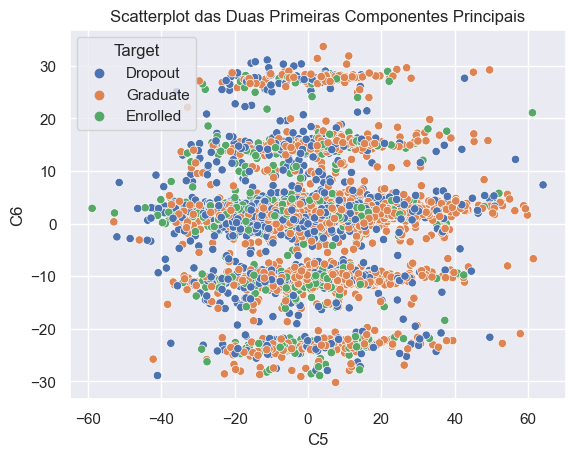

In [96]:
student_data_pca = student_data_pca[['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'Target']]

sns.scatterplot(data=student_data_pca, x='C5', y='C6', hue='Target')

plt.title('Scatterplot das Duas Primeiras Componentes Principais')
plt.show()

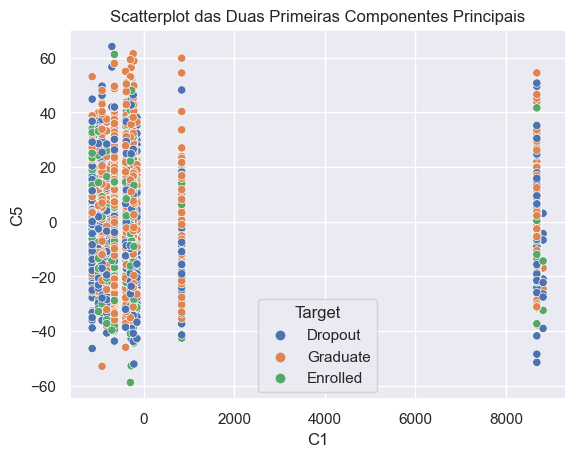

In [97]:
student_data_pca = student_data_pca[['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'Target']]

sns.scatterplot(data=student_data_pca, x='C1', y='C5', hue='Target')

plt.title('Scatterplot das Duas Primeiras Componentes Principais')
plt.show()

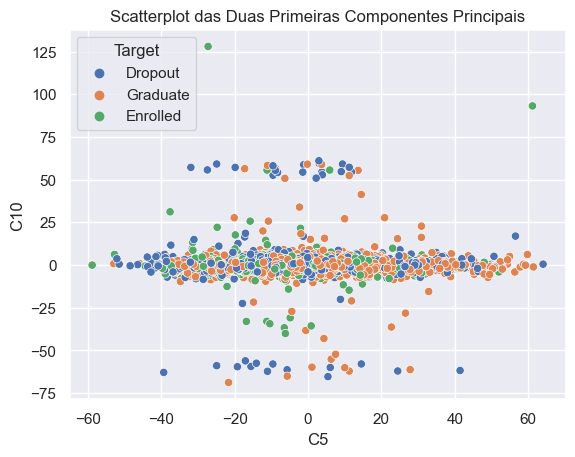

In [98]:
student_data_pca = student_data_pca[['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'Target']]

sns.scatterplot(data=student_data_pca, x='C5', y='C10', hue='Target')

plt.title('Scatterplot das Duas Primeiras Componentes Principais')
plt.show()

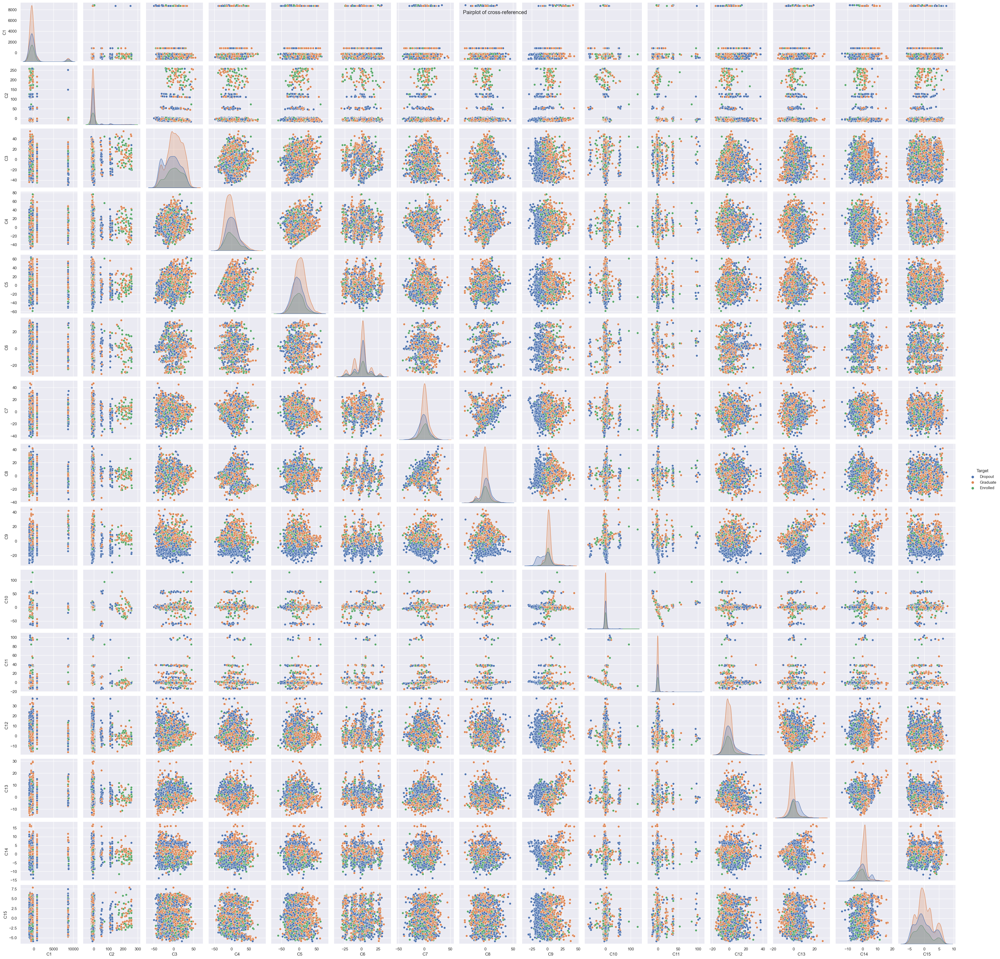

In [99]:
sns.pairplot(student_data_pca, hue='Target')
plt.suptitle('Pairplot of cross-referenced')
plt.show()

In [100]:
student_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Marital_status                                4424 non-null   float64
 1   Application_mode                              4424 non-null   int64  
 2   Application_order                             4424 non-null   int64  
 3   Course                                        4424 non-null   float64
 4   Daytime/evening_attendance                    4424 non-null   int64  
 5   Previous_qualification                        4424 non-null   int64  
 6   Previous_qualification_grade                  4424 non-null   float64
 7   Nacionality                                   4424 non-null   int64  
 8   Mother_qualification                          4424 non-null   int64  
 9   Father_qualification                          4424 non-null   f

### As mentioned though the class the pie chart should be used just for to display relative frequencies and for equal o less than 4 frequencies only. Then as a way of presenting the Gender of study, the Nacionality, percentage of Scholarship Holder and percentage of Debtors decided to representing by pie chart.

In [101]:
gender_counts = student_data['Gender'].value_counts()
gender_counts

Gender
0    2868
1    1556
Name: count, dtype: int64

In [102]:
gender_probabilities = gender_counts/len(student_data)
gender_probabilities

Gender
0    0.648282
1    0.351718
Name: count, dtype: float64

Text(0.5, 1.0, 'Gender of those who study')

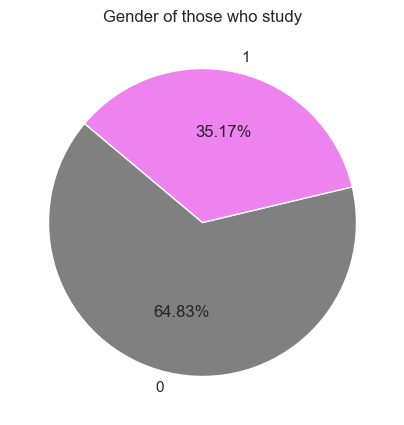

In [103]:
colors = ['grey', 'violet']

plt.figure(figsize = (5, 5))
plt.pie(gender_counts, labels = gender_counts.index, autopct = '%1.2f%%', startangle = 140, colors=colors)
plt.title('Gender of those who study')

### First it was defined the count of Gender, after that called the count of gender divided per the variables (0 and 1). As we can see above the percentage who are male is represented by 1 and 0 female, which representing 37.17% of the total are male and 64.83 female.

In [104]:
International_counts = student_data['International'].value_counts()
International_counts

International
0.0    4314
1.0     110
Name: count, dtype: int64

In [105]:
International_probabilities = International_counts/len(student_data)
International_probabilities

International
0.0    0.975136
1.0    0.024864
Name: count, dtype: float64

In [106]:
International_probabilities *= 100
print(International_probabilities.apply(lambda x: f"{x:.2f}%"))

International
0.0    97.51%
1.0     2.49%
Name: count, dtype: object


Text(0.5, 1.0, 'Who is foreing or not')

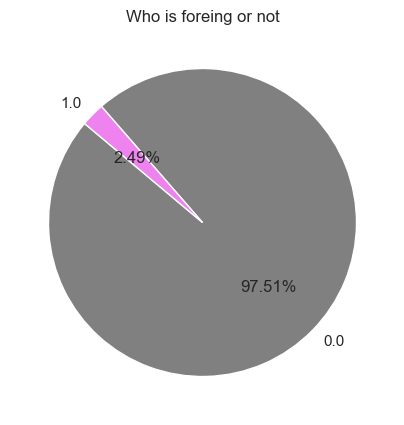

In [107]:
colors = ['grey', 'violet']

plt.figure(figsize = (5, 5))
plt.pie(International_probabilities, labels = International_probabilities.index, autopct = '%1.2f%%', startangle = 140, colors=colors)
plt.title('Who is foreing or not')

### The same process was called above but with the International variabel, which one we can see that massive 97.51% are not international student, and just 2.49% are international students. 

In [108]:
Debtor_counts = student_data['Debtor'].value_counts()
Debtor_counts

Debtor
0.0    3921
1.0     503
Name: count, dtype: int64

In [109]:
Debtor_probabilities = Debtor_counts/len(student_data)
Debtor_probabilities

Debtor
0.0    0.886302
1.0    0.113698
Name: count, dtype: float64

Text(0.5, 1.0, 'Percentage who are debtors')

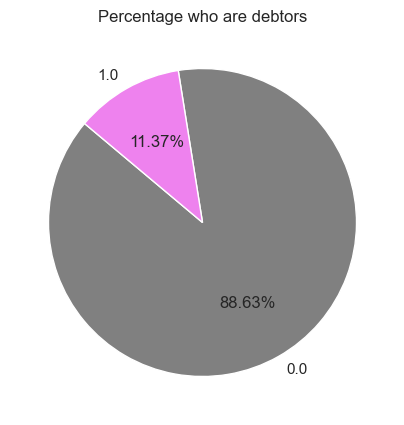

In [110]:
colors = ['grey', 'violet']

plt.figure(figsize = (5, 5))
plt.pie(Debtor_probabilities, labels = Debtor_probabilities.index, autopct = '%1.2f%%', startangle = 140, colors=colors)
plt.title('Percentage who are debtors')

### As the above the same function again called for represeting the Debtor, it means who are debtor into the sample of the dataset. just 11.37% are debtors and the rest 88.63% are not debtors.

In [111]:
Scholarship_holder_counts = student_data['Scholarship_holder'].value_counts()
Scholarship_holder_counts

Scholarship_holder
0    3325
1    1099
Name: count, dtype: int64

In [112]:
Scholarship_holder_probabilities = Scholarship_holder_counts/len(student_data)
Scholarship_holder_probabilities

Scholarship_holder
0    0.751582
1    0.248418
Name: count, dtype: float64

Text(0.5, 1.0, 'Percentage who is holder')

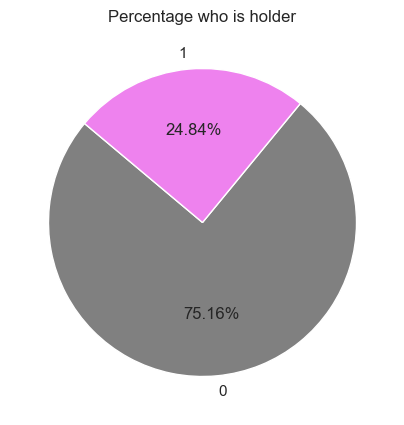

In [113]:
colors = ['grey', 'violet']

plt.figure(figsize = (5, 5))
plt.pie(Scholarship_holder_probabilities, labels = Scholarship_holder_probabilities.index, autopct = '%1.2f%%', startangle = 140, colors=colors)
plt.title('Percentage who is holder')

### To finish the pie chart part we can see that 75.16% of the sample has not scholarship holder and 24.84% has scholarship holder.

### On the below was called thedisplot to return the number of Maritial Status representing by 1 – single 2 – married 3 – widower 4 – divorced 5 – facto union 6 – legally separated. The graph returned the most of the people, more than approximately 3800 people are single; less than 500 people are married, and a smal group around 100 divorced; the rest of the sample has not significant importance on it.

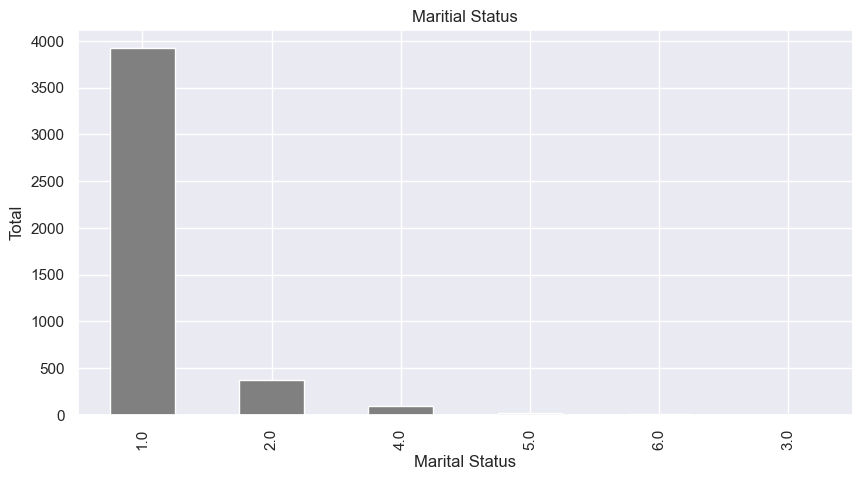

In [114]:
student_data.Marital_status.value_counts().nlargest(10).plot(kind="bar", color='gray', figsize=(10,5))
plt.title("Maritial Status")
plt.ylabel("Total")
plt.xlabel("Marital Status");

###  Here after called the count of the Mothers Qualification group and ajusting by size and figures, the number 1 is represented by Secondary Education followed by 37 Basic Education 1st Cycle, and Basic Education 3rd Cycle each are representing approximately 1100, 1000 and 950 each. In a second level representing the 38 are people who has Basic Education 2nd Cycle (6th/7th/8th Year), 3 hwho has Higher Education and 34 Unknow or not answered.

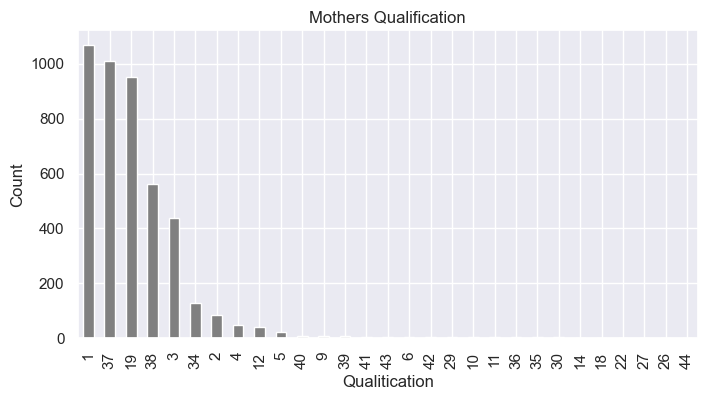

In [115]:
student_data.Mother_qualification.value_counts().nlargest(50).plot(kind="bar", color='gray', figsize=(8,4))
plt.title("Mothers Qualification")
plt.ylabel("Count")
plt.xlabel("Qualitication");

### On the below we can see that the most popular variable are 1 who are Graduate representing more than 2000, the second one is 0 who were  who dropped out of the course, and the third one 2 representing who is enrolled.

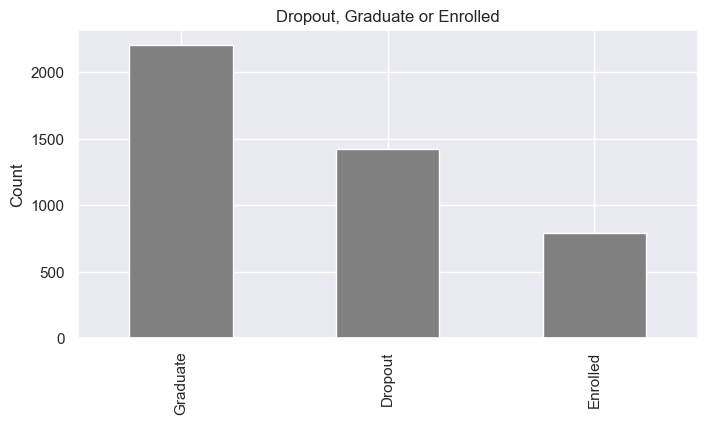

In [116]:
student_data.Target.value_counts().nlargest(50).plot(kind="bar", color='gray', figsize=(8,4))
plt.title("Dropout, Graduate or Enrolled")
plt.ylabel("Count")
plt.xlabel("");

[Text(0.5, 0, 'Administration'),
 Text(0, 0.5, 'Companies'),
 Text(0.5, 1.0, 'Administration Histogram')]

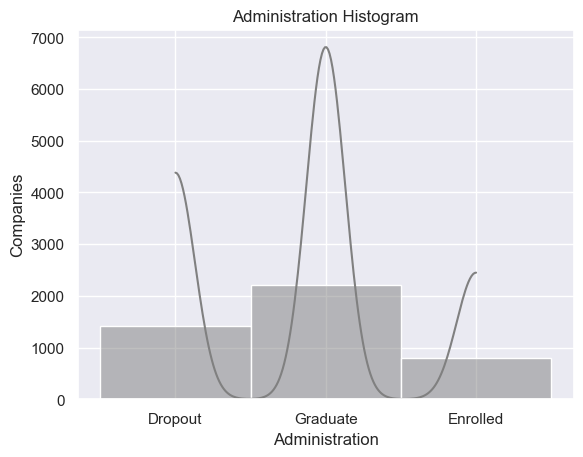

In [117]:
ax = sns.histplot(student_data.Target, kde = True, color='gray')
ax.set(xlabel = 'Administration', ylabel = 'Companies', title = 'Administration Histogram')


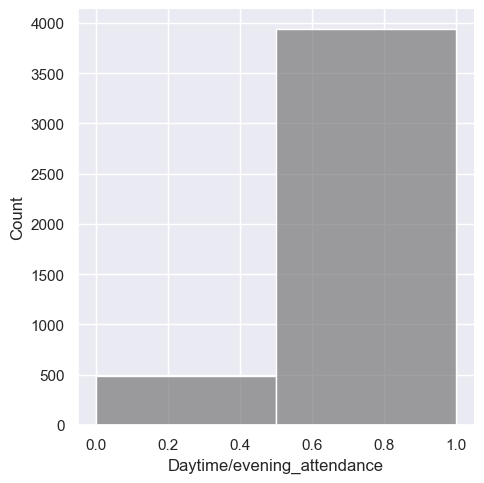

In [118]:
sns.displot(data=student_data, x='Daytime/evening_attendance', binwidth=0.5, color='gray')

### On the below we can see that the Inflation Rate stayed between 0.8 and 3.7 and the average representing around 1.4% approxaimately.

<Axes: xlabel='Inflation rate'>

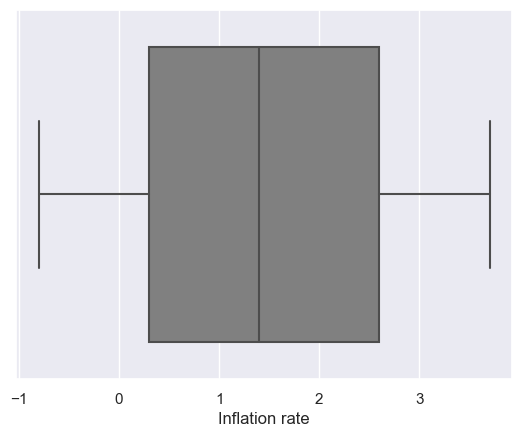

In [119]:
sns.boxplot(data=student_data, x='Inflation rate', color='gray')

###  On the below we can see that the Unemployment rate was around 7.6% and the maxium arrived to 16.2 but the average stayed around 11% of unemployments.

<Axes: xlabel='Unemployment_rate'>

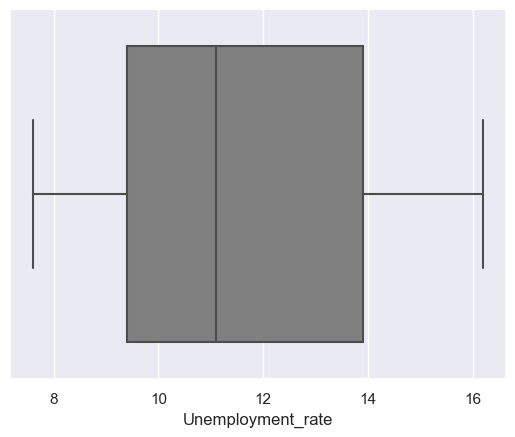

In [120]:
sns.boxplot(data=student_data, x='Unemployment_rate', color='gray')

## Dimensionality and the curse of dimensionality: 

### For Provost & Fawcett (2013) the method of Nearest-neighbor for example, can consider all the resources to calculate a distance between 2 points. If an attribute has a multiple and different gamas this can effect the attribute with a wide range that can reverse the purpose of dimensionality. One complex example could have too many attributes where these attributes are complex, redundance or irrelevant the similarity can be confused and deceive for the reason that there are many attributes irrelavants.


## In my own words:

### in data analytics, when talking about high-dimensional data, two things must be considered as they can lead to the so-called curse of dimensionality:
### As people have limited capabilities to find patterns in a large data dimension, Mahcine Learning tries to identify these high attributes and variables spread across different dimensions.
### As more dimensions are added, that is, variables and attributes, the data necessary to create high-frequency models increases, therefore, as this number increases, the classification performance increases to achieve the ideal number of resources or variables to find these patterns.
### However, if you significantly increase the size and quantity of these sets, there may be degradation, as the data starts to become very sparse.
### Therefore, a balance must be found, an average for both, so mentioning data sparsity and distance concentration are discussed.
### Finally, use dimensionality reduction techniques such as disregarding or removing less important attributes or transforming high-dimensional attributes into smaller components. The PCA is one of these tools.

## Conclusion:

### After generated and called all the functions above finally we can predict and get some important results about the datset student_data. Initially the dataseat had 4424 observations and 37 features, that after transformed some missing data and called the PCA it was reduced to 15 features to reach around 99.5% of variance/signal of the dataset. Even that was tried 5 and 10 number of components the best number was 15 to explain better the patterns.

### After splitted the dataset to be tested and trained it to try to get a better accuracy was tried 1, 42 and 80 the random_state and the better alternative reached was 1 with  71.48% of accuracy. and The best algorithm model was identified as Logistic Regression.

### Even that we can cross-reference many different variables and sample and get many results to not be consumed long time because we have some bondaries to work on project as the deadline to be done is a bit short, we gonna go straight forward the visualizations that there are some highlights to be mentioned. First of all is that 37.17% of the total of the dataset are male and 64.83 female. And 97.51% are not international student and just 11.37% of people are debtors. Also the pie chart revealed that 75.16% of the sample has not scholarship holder.

### It also needs to be highlighted the most of the people are single representing approximately 3800 people and less than 500 people are married. Also the visualizations showed us after called the Mothers Qualification group is massive represented by Secondary Education followed by 37 Basic Education 1st Cycle, and Basic Education 3rd Cycle each are representing approximately 1100, 1000 and 950 each. 

### The data returned as well who has graduation that is representing by more than 2000 people it means almost 50% of the people, the second one is representing approximately 32% (1400) who dropped out of the course, and the third one 2 representing 75% who is enrolled with 750 people approximately.

### It is important mention as well that some columns were not used for the reason that as first Capstone I did not have the pressuming that it was relevant or not the columns for the purpuse of the project, on that way all the columns was keeping on it on the beggining fo the Capstone.

### Then after these visualizations was called some ghrapics by Boxplot models. The ghrapic returned that the Inflation Rate stayed between 0.8 and 3.7 and the average representing around 1.4% approxaimately. And when called the Boxplot to representing the Unemployment rate was around 7.6% and the maxium arrived to 16.2 but the average stayed around 11% of unemployments.

### To be finished the conclusion we can resume that most of the people has graduated and are male, and most of them doesn't have debt. About the mothers most of them have Secondary Education, Basic Education 1st Cycle or Basic Education 3rd Cycle 

## References:

    Elmasri, R., & Navathe, S. (2016). Fundamentals of Database Systems (7th ed.). Pearson.
    
    Foxwell, H. F. (2020). Creating Good Data: A Guide To Dataset Structure And Data Representation. Apress
    
    Lichman, M. (2013). UCI Machine Learning Repository [http://archive.ics.uci.edu/ml]. Irvine, CA: University of California, School of Information and Computer Science.
    
    McKinney, W. (2017). Python for Data Analysis: Data Wrangling with Pandas, NumPy, and IPython. O'Reilly Media.

    Provost, F., & Fawcett, T. (2013). Data Science for Business: What You Need to Know About Data Mining and Data-Analytic Thinking. O'Reilly Media.
   
    Seaborn. (2024). Scatterplot. Access on 27.03.2024. Available at: https://seaborn.pydata.org/tutorial/relational.html
    
    Seaborn. (2024). Boxplot. Access on 27.03.2024. Available at: https://seaborn.pydata.org/generated/seaborn.boxplot.html
    
    Seaborn. (2024). Displot. Access on 27.03.2024. Available at: https://seaborn.pydata.org/generated/seaborn.displot.html
    
    SkLearn Documentation. (2024). Logistic Regression model. Access on 30.03.2024. Available at: https://scikit-
    learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
    
    SkLearn Documentation. (2024). random_state function. Access on 30.03.2024. Available at:  https://scikit-
    learn.org/stable/glossary.html#term-random_state
    
    SkLearn Documentation. (2024). StartifiedKFold function. Access on 30.03.2024. Available at:  https://scikit-
    learn.org/stable/modules/generated/sklearn.model_selection.StratifiedKFold.html#sklearn.model_selection.StratifiedKFold
    https://scikit-
    
    SkLearn Documentation. (2024). Shuffle Function. Access on 30.03.2024. Available at:learn.org/stable/modules/generated/sklearn.utils.shuffle.html#:~:text=sklearn.utils.shuffle%28%2Aarrays%2C%20random_state%3DNone%2C%20n_samples%3DNone%29%20%5Bsource%5D%20%C2%B6%20Shuffle%20arrays%20or,replace%3DFalse%29%20to%20do%20random%20permutations%20of%20the%20collections.